In [1]:
#COVID19Map.py
### import all modules that we will use in this lesson
import geopandas
import numpy as np
import pandas as pd
# We won't actually use datetime directly. Since the dataframe index will use 
# data formatted as datetime64, I import it in case I need to use the datetime
# module to troubleshoot later 
import datetime
# you could technically call many of the submodules from matplotlib using mpl., 
#but for convenience we explicitly import submodules. These will be used for 
# constructing visualizations
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import cm
# If you choose to make a dynamic visualization for the homework
from matplotlib.animation import FuncAnimation
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.ticker as mtick
import datadotworld as dw

def import_covid_data(filename, FIPS_name):
    # Load COVID19 county data using datadotworld API
    # Data provided by Johns Hopkins, file provided by Associated Press
    dataset = dw.load_dataset("associatedpress/johns-hopkins-coronavirus-case-tracker",
                              auto_update = True)
    # the dataset includes multiple dataframes. We will only use #2
    covid_data = dataset.dataframes[
        "2_cases_and_deaths_by_county_timeseries"]
    # Include only oberservation for political entities within states
    # i.e., not territories, etc... drop any nan fip values with covid_data[FIPS_name] > 0
    covid_data = covid_data[covid_data[FIPS_name] < 57000]
    covid_data = covid_data[covid_data[FIPS_name] > 0]
    # Transform FIPS codes into integers (not floats)
    covid_data[FIPS_name] = covid_data[FIPS_name].astype(int)
    covid_data.set_index([FIPS_name, "date"], inplace = True)
    # Prepare a column for state abbreviations. We will draw these from a
    # dictionary created in the next step.
    covid_data["state_abr"] = ""
    for state, abr in state_dict.items():
        covid_data.loc[covid_data["state"] == state, "state_abr"] = abr
    # Create "Location" which concatenates county name
    # and state abbreviation 
    covid_data["Location"] = covid_data["location_name"] + ", " + \
        covid_data["state_abr"]

    return covid_data


def import_geo_data(filename, index_col = "Date", FIPS_name = "FIPS"):
    # import county level shapefile
    map_data = geopandas.read_file(filename = filename,                                   
                                   index_col = index_col)
    # rename fips code to match variable name in COVID-19 data
    map_data.rename(columns={"State":"state"},
                    inplace = True)
    # Combine statefips and county fips to create a single fips value
    # that identifies each particular county without referencing the 
    # state separately
    map_data[FIPS_name] = map_data["STATEFP"].astype(str) + \
        map_data["COUNTYFP"].astype(str)
    map_data[FIPS_name] = map_data[FIPS_name].astype(np.int64)
    # set FIPS as index
    map_data.set_index(FIPS_name, inplace=True)
    
    return map_data

# I include this dictionary to convenienlty cross reference state names and
# state abbreviations.
state_dict = {    
    'Alabama': 'AL', 'Alaska': 'AK', 'Arizona': 'AZ',
    'Arkansas': 'AR', 'California': 'CA', 'Colorado': 'CO', 'Connecticut': 'CT', 
    'Delaware': 'DE', 'District of Columbia': 'DC', 'Florida': 'FL', 
    'Georgia': 'GA', 'Hawaii': 'HI', 'Idaho': 'ID', 'Illinois': 'IL',
    'Indiana': 'IN', 'Iowa': 'IA','Kansas': 'KS', 'Kentucky': 'KY',
    'Louisiana': 'LA', 'Maine': 'ME', 'Maryland': 'MD', 'Massachusetts': 'MA',
    'Michigan': 'MI', 'Minnesota': 'MN', 'Mississippi': 'MS', 'Missouri': 'MO',
    'Montana': 'MT', 'Nebraska': 'NE', 'Nevada': 'NV', 'New Hampshire': 'NH',
    'New Jersey': 'NJ', 'New Mexico': 'NM', 'New York': 'NY', 'North Carolina': 'NC',
    'North Dakota': 'ND', 'Ohio': 'OH', 'Oklahoma': 'OK',
    'Oregon': 'OR', 'Pennsylvania': 'PA', 'Rhode Island': 'RI',
    'South Carolina': 'SC', 'South Dakota': 'SD', 'Tennessee': 'TN', 'Texas': 'TX',
    'Utah': 'UT', 'Vermont': 'VT', 'Virginia': 'VA',
    'Washington': 'WA', 'West Virginia': 'WV', 'Wisconsin': 'WI', 'Wyoming': 'WY'}


In [2]:
fips_name = "fips_code"
covid_filename = "COVID19DataAP.csv"
# rename_FIPS matches map_data FIPS with COVID19 FIPS name
map_data = import_geo_data(filename = "countiesWithStatesAndPopulation.shp",
                    index_col = "Date", FIPS_name= fips_name)
covid_data = import_covid_data(filename = covid_filename, FIPS_name = fips_name)

/Users/shoo/opt/anaconda3/lib/python3.7/site-packages/datadotworld/models/dataset.py:209: UserWarning: Unable to set data frame dtypes automatically using 2_cases_and_deaths_by_county_timeseries schema. Data types may need to be adjusted manually. Error: Integer column has NA values in column 2
  'Error: {}'.format(resource_name, e))


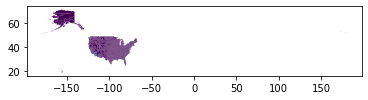

In [3]:
map_data.plot(column = "Population")

In [4]:
map_data

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,NAME,LSAD,ALAND,AWATER,Population,state,geometry
fips_code,,,,,,,,,,,
21007,21,007,00516850,0500000US21007,Ballard,06,639387454,69473325,7888.0,Kentucky,"POLYGON ((-89.18137 37.04630, -89.17938 37.053..."
21017,21,017,00516855,0500000US21017,Bourbon,06,750439351,4829777,19788.0,Kentucky,"POLYGON ((-84.44266 38.28324, -84.44114 38.283..."
21031,21,031,00516862,0500000US21031,Butler,06,1103571974,13943044,12879.0,Kentucky,"POLYGON ((-86.94486 37.07341, -86.94346 37.074..."
21065,21,065,00516879,0500000US21065,Estill,06,655509930,6516335,14106.0,Kentucky,"POLYGON ((-84.12662 37.64540, -84.12483 37.646..."
21069,21,069,00516881,0500000US21069,Fleming,06,902727151,7182793,14581.0,Kentucky,"POLYGON ((-83.98428 38.44549, -83.98246 38.450..."
21093,21,093,00516893,0500000US21093,Hardin,06,1614569777,17463238,110958.0,Kentucky,"POLYGON ((-86.27756 37.58881, -86.27420 37.589..."
21099,21,099,00516896,0500000US21099,Hart,06,1068530028,13692536,19035.0,Kentucky,"POLYGON ((-86.16112 37.35080, -86.15845 37.351..."
21131,21,131,00516912,0500000US21131,Leslie,06,1038206077,9189732,9877.0,Kentucky,"POLYGON ((-83.55310 37.07928, -83.53528 37.103..."
21151,21,151,00516919,0500000US21151,Madison,06,1132729653,15306635,92987.0,Kentucky,"POLYGON ((-84.52564 37.76950, -84.52350 37.771..."


In [5]:
covid_data

uid location_type location_name    state  \
fips_code date                                                        
1001      2020-01-22  84001001        county       Autauga  Alabama   
          2020-01-23  84001001        county       Autauga  Alabama   
          2020-01-24  84001001        county       Autauga  Alabama   
          2020-01-25  84001001        county       Autauga  Alabama   
          2020-01-26  84001001        county       Autauga  Alabama   
          2020-01-27  84001001        county       Autauga  Alabama   
          2020-01-28  84001001        county       Autauga  Alabama   
          2020-01-29  84001001        county       Autauga  Alabama   
          2020-01-30  84001001        county       Autauga  Alabama   
          2020-01-31  84001001        county       Autauga  Alabama   
          2020-02-01  84001001        county       Autauga  Alabama   
          2020-02-02  84001001        county       Autauga  Alabama   
          2020-02-03  84001001        county       Autauga  Alabama   
          2020-02-04  84001001        county       Autauga  Alabama   
          2020-02-05  84001001        county       Autauga  Alabama   
          2020-02-06  84001001        county       Autauga  Alabama   
          2020-02-07  84001001        county       Autauga  Alabama   
          2020-02-08  84001001        county       Autauga  Alabama   
          2020-02-09  84001001        county       Autauga  Alabama   
          2020-02-10  84001001        county       Autauga  Alabama   
          2020-02-11  84001001        county       Autauga  Alabama   
          2020-02-12  84001001        county       Autauga  Alabama   
          2020-02-13  84001001        county       Autauga  Alabama   
          2020-02-14  84001001        county       Autauga  Alabama   
          2020-02-15  84001001        county       Autauga  Alabama   
          2020-02-16  84001001        county       Autauga  Alabama   
          2020-02-17  84001001        county       Autauga  Alabama   
          2020-02-18  84001001        county       Autauga  Alabama   
          2020-02-19  84001001        county       Autauga  Alabama   
          2020-02-20  84001001        county       Autauga  Alabama   
...                        ...           ...           ...      ...   
56045     2020-10-06  84056045        county        Weston  Wyoming   
          2020-10-07  84056045        county        Weston  Wyoming   
          2020-10-08  84056045        county        Weston  Wyoming   
          2020-10-09  84056045        county        Weston  Wyoming   
          2020-10-10  84056045        county        Weston  Wyoming   
          2020-10-11  84056045        county        Weston  Wyoming   
          2020-10-12  84056045        county        Weston  Wyoming   
          2020-10-13  84056045        county        Weston  Wyoming   
          2020-10-14  84056045        county        Weston  Wyoming   
          2020-10-15  84056045        county        Weston  Wyoming   
          2020-10-16  84056045        county        Weston  Wyoming   
          2020-10-17  84056045        county        Weston  Wyoming   
          2020-10-18  84056045        county        Weston  Wyoming   
          2020-10-19  84056045        county        Weston  Wyoming   
          2020-10-20  84056045        county        Weston  Wyoming   
          2020-10-21  84056045        county        Weston  Wyoming   
          2020-10-22  84056045        county        Weston  Wyoming   
          2020-10-23  84056045        county        Weston  Wyoming   
          2020-10-24  84056045        county        Weston  Wyoming   
          2020-10-25  84056045        county        Weston  Wyoming   
          2020-10-26  84056045        county        Weston  Wyoming   
          2020-10-27  84056045        county        Weston  Wyoming   
          2020-10-28  84056045        county        Weston  Wyoming   
          2020-10-29  84056045        county       

In [6]:
#COVID19Map.py
# . . .
def create_covid_geo_dataframe(covid_data, map_data, dates):
    # create geopandas dataframe with multiindex for date
    # original geopandas dataframe had no dates, so copies of the df are 
    # stacked vertically, with a new copy for each date in the covid_data index
    #(dates is a global)
    i = 0
    for date in dates:
        # select county observations from each date in dates
        df = covid_data[covid_data.index.get_level_values("date")==date]
        # use the fips_codes from the slice of covid_data to select counties
        # from the map_data index,making sure that the map_data index matches
        # the covid_data index
        counties = df.index.get_level_values("fips_code")
        # call a slice of the geodataframe that includes the counties 
        # that are in covid_data
        agg_df = map_data.loc[counties]
        # each row should reflect the date so that it is aligned 
        # with covid_data
        agg_df["date"] = date
        if i == 0:
            # create the geodataframe, select coordinate system (.crs) to
            # match map_data.crs
            matching_gpd = geopandas.GeoDataFrame(agg_df, crs = map_data.crs)
            i += 1
        else:
            # after initial geodataframe is created, stack a dataframe for
            # each date in dates. Once completed, index of matching_gpd
            # will match index of covid_data
            matching_gpd = matching_gpd.append(agg_df, ignore_index = False)         
    # Set mathcing_gpd index as["fips_code", "date"], liked covid_data index
    matching_gpd.reset_index(inplace=True)
    matching_gpd.set_index(["fips_code","date"], inplace = True)
    # add each column from covid_data to mathcing_gpd
    for key, val in covid_data.items():
        matching_gpd[key] = val
    return matching_gpd       

# . . . to end of script . . .
# dates will be used to create a geopandas DataFrame with multiindex 
dates = sorted(list(set(covid_data.index.get_level_values("date"))))
covid_data = create_covid_geo_dataframe(covid_data, map_data, dates)

In [7]:
covid_data

,,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,NAME,LSAD,ALAND,AWATER,Population,state,...,cumulative_deaths,cumulative_deaths_per_100_000,new_cases,new_deaths,new_cases_per_100_000,new_deaths_per_100_000,new_cases_7_day_rolling_avg,new_deaths_7_day_rolling_avg,state_abr,Location
fips_code,date,,,,,,,,,,,,,,,,,,,,,
1001,2020-01-22,1,001,00161526,0500000US01001,Autauga,06,1539602123,25706961,55869.0,Alabama,...,0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,AL,"Autauga, AL"
1003,2020-01-22,1,003,00161527,0500000US01003,Baldwin,06,4117546676,1133055836,223234.0,Alabama,...,0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,AL,"Baldwin, AL"
1005,2020-01-22,1,005,00161528,0500000US01005,Barbour,06,2292144655,50538698,24686.0,Alabama,...,0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,AL,"Barbour, AL"
1007,2020-01-22,1,007,00161529,0500000US01007,Bibb,06,1612167481,9602089,22394.0,Alabama,...,0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,AL,"Bibb, AL"
1009,2020-01-22,1,009,00161530,0500000US01009,Blount,06,1670103911,15015423,57826.0,Alabama,...,0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,AL,"Blount, AL"
1011,2020-01-22,1,011,00161531,0500000US01011,Bullock,06,1613059160,6054988,10101.0,Alabama,...,0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,AL,"Bullock, AL"
1013,2020-01-22,1,013,00161532,0500000US01013,Butler,06,2012002530,2701198,19448.0,Alabama,...,0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,AL,"Butler, AL"
1015,2020-01-22,1,015,00161533,0500000US01015,Calhoun,06,1569189622,16627597,113605.0,Alabama,...,0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,AL,"Calhoun, AL"
1017,2020-01-22,1,017,00161534,0500000US01017,Chambers,06,1545085607,16971701,33254.0,Alabama,...,0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,AL,"Chambers, AL"


In [8]:
#COVID19Map.py
# . . .
def create_new_vars(covid_data, moving_average_days):
    # use a for loop that performs the same operations on data for cases and for deaths
    for key in ["cases", "deaths"]:
        # create a version of the key with the first letter of each word capitalized
        cap_key = key.title()
        covid_data[cap_key + " per Million"] = covid_data["cumulative_" + key]\
            .div(covid_data["total_population"]).mul(10 ** 6)
        # generate daily data normalized per million population by taking the daily difference within each
        # entity (covid_data.index.names[0]), dividing this value by population and multiplying that value
        # by 1 million 10 ** 6
        covid_data["Daily " + cap_key + " per Million"] = \
            covid_data["cumulative_" + key ].groupby(covid_data.index.names[0])\
            .diff(1).div(covid_data["total_population"]).mul(10 ** 6)
        # taking the rolling average; choice of number of days is passed as moving_average_days
        covid_data["Daily " + cap_key + " per Million MA"] = covid_data["Daily " + \
                  cap_key + " per Million"].rolling(moving_average_days).mean()
# . . .
moving_average_days = 7
create_new_vars(covid_data, moving_average_days)

Text(0.5, 1.0, '2020-11-04\nCOVID-19 in the U.S.')

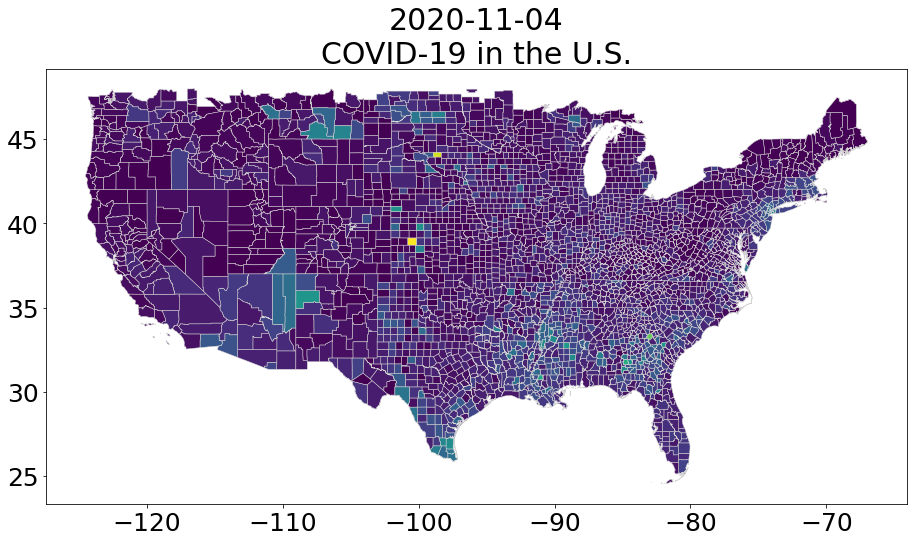

In [15]:
#COVID19Map.py
#. . . 

# only include observations within these boundaries
# this will shrink the size of the map
def select_data_within_bounds(data, minx, miny, maxx, maxy):
    data = data[data.bounds["maxx"] <= maxx]
    data = data[data.bounds["maxy"] <= maxy]
    data = data[data.bounds["minx"] >= minx]
    data = data[data.bounds["miny"] >= miny]
    
    return data

# . . . to end of script
# choose most recent date in data
date = dates[-1]

# choose map bounds
if "map_bounded" not in locals():
    minx = -127
    miny = 23
    maxx = -66
    maxy = 55
    covid_data = select_data_within_bounds(covid_data, minx, miny, maxx, maxy)
    map_bounded = True
    
fig, ax = plt.subplots(figsize=(18,8),
        subplot_kw = {'aspect': 'equal'})   
plt.rcParams.update({"font.size": 30})
plt.xticks(fontsize = 25)
plt.yticks(fontsize = 25)
key = "Deaths per Million"
df = covid_data[covid_data.index.get_level_values("date") == date]
df.plot(ax=ax, cax = ax, column=key, linewidth=.5, 
             edgecolor='lightgrey')
ax.set_title(str(date) + "\n" + "COVID-19 in the U.S.", fontsize = 30)

Text(0.5, 1.0, '2020-11-04\nCOVID-19 in the U.S.')

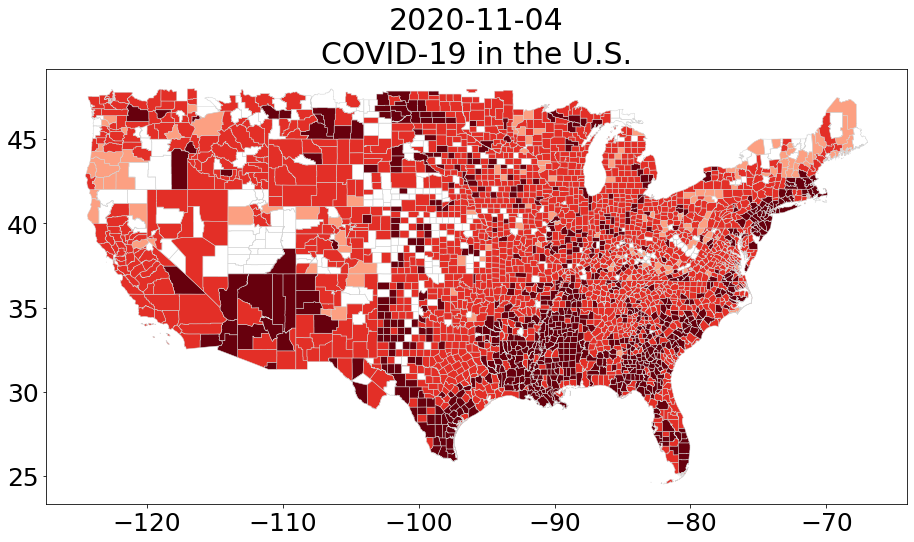

In [10]:
#COVID19Map.py
# . . . to end of script
fig, ax = plt.subplots(figsize=(18,8),
        subplot_kw = {'aspect': 'equal'})   
plt.rcParams.update({"font.size": 30})
plt.xticks(fontsize = 25)
plt.yticks(fontsize = 25)
key = "Deaths per Million"
# change colors, divide into 4 distinct colors
cmap = cm.get_cmap('Reds', 4)
vmin = 1 
vmax = df[key].max()

norm = cm.colors.LogNorm(vmin=vmin, vmax =vmax)
plt.cm.ScalarMappable(cmap=cmap, norm=norm)
df = covid_data[covid_data.index.get_level_values("date") == date]
df.plot(ax=ax, cax = ax, column=key, vmin=vmin ,vmax = vmax, 
             cmap = cmap, legend=False, linewidth=.5, edgecolor='lightgrey', 
             norm = norm)

ax.set_title(str(date) + "\n" + "COVID-19 in the U.S.", fontsize = 30)

Text(0.5, 1.0, '2020-11-04\nCOVID-19 in the U.S.')

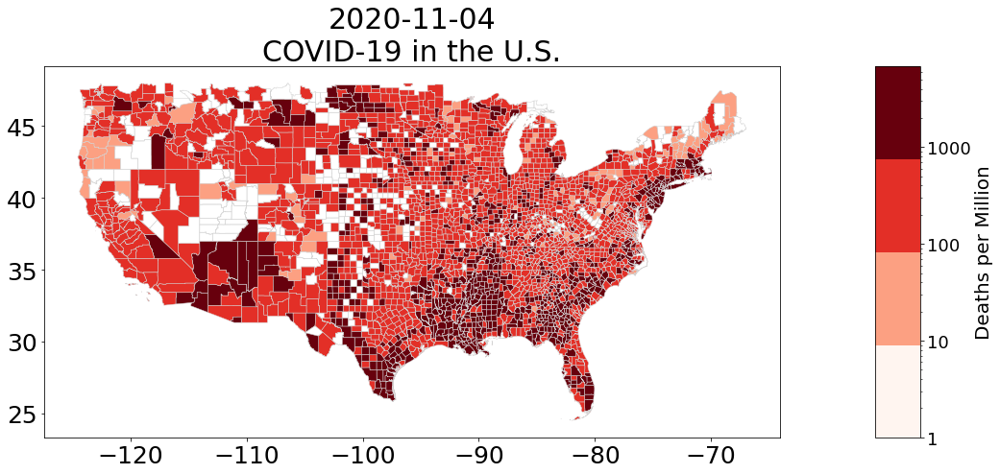

In [11]:
fig, ax = plt.subplots(figsize=(18,8),
        subplot_kw = {'aspect': 'equal'})   
plt.rcParams.update({"font.size": 30})
plt.xticks(fontsize = 25)
plt.yticks(fontsize = 25)
key = "Deaths per Million"
df = covid_data[covid_data.index.get_level_values("date")==date]
cmap = cm.get_cmap('Reds', 4)
vmin = 1 
vmax = df[key].max()
norm = cm.colors.LogNorm(vmin=vmin, vmax =vmax)

############## Add Colorbar ################
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
# empty array for the data range
sm._A = []
# prepare space for colorbar
divider = make_axes_locatable(ax)
size = "5%" 
cax = divider.append_axes("right", size = size, pad = 0.1)
# add colorbar to figure
cbar = fig.colorbar(sm, cax=cax, cmap = cmap)
cbar.ax.tick_params(labelsize=18)
vals = list(cbar.ax.get_yticks())
vals.append(vmax)
# format colorbar values as int
cbar.ax.set_yticklabels([int(x) for x in vals])
cbar.ax.set_ylabel(key, fontsize = 20)


df.plot(ax=ax, cax = ax, column=key, vmin=vmin ,vmax = vmax, 
             cmap = cmap, legend=False, linewidth=.5, edgecolor='lightgrey', 
             norm = norm)
ax.set_title(str(date)[:10] + "\n" + "COVID-19 in the U.S.", fontsize = 30)

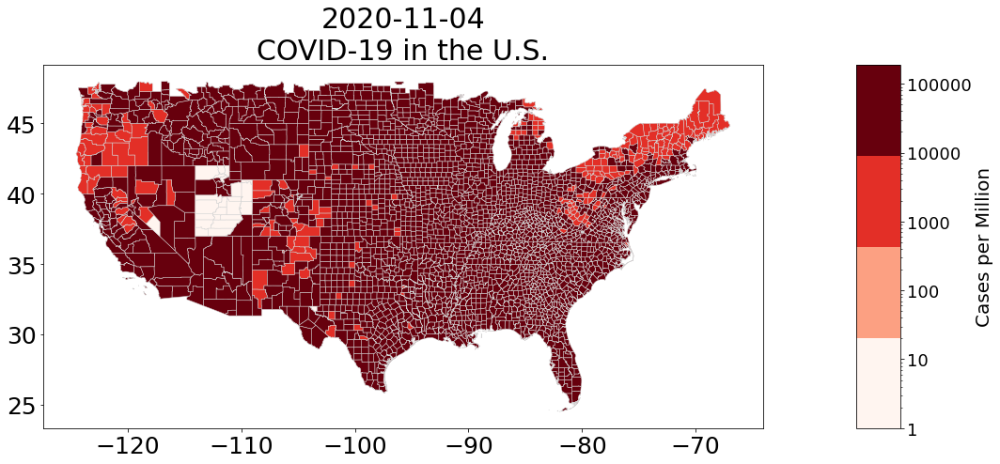

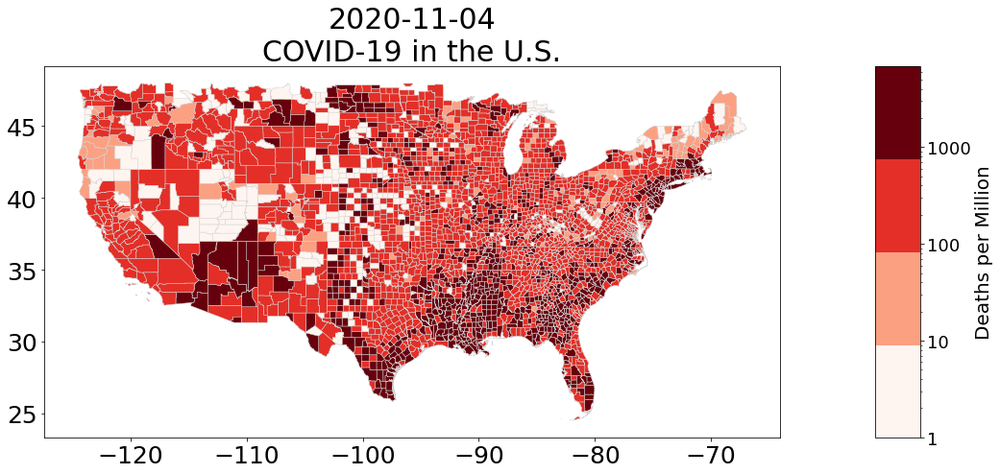

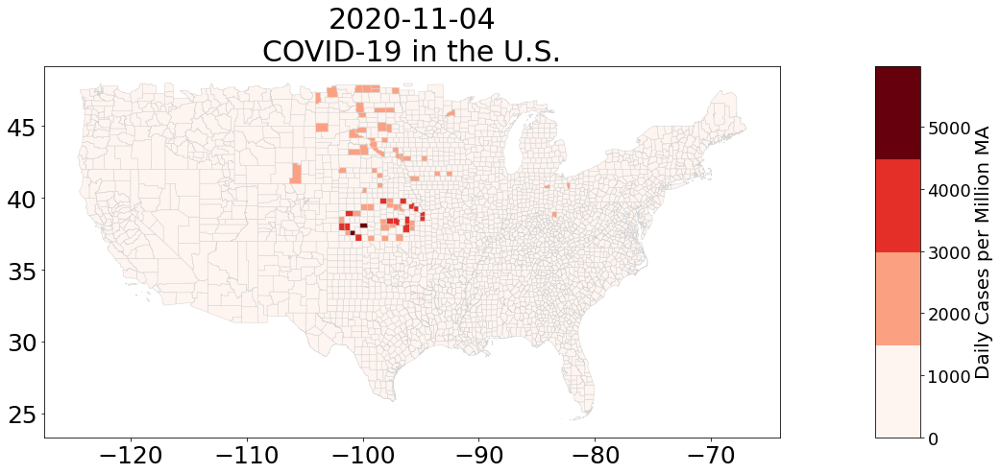

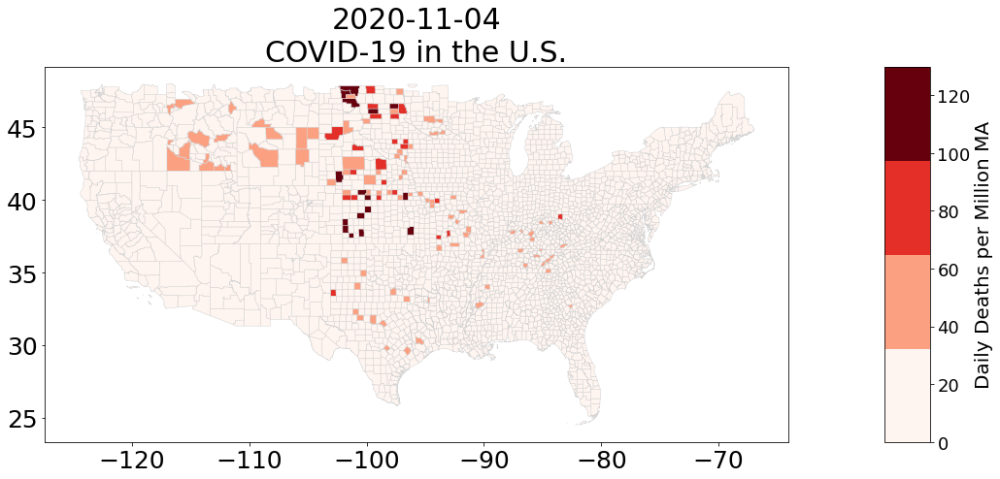

In [12]:
keys = ["Cases per Million", "Deaths per Million", 
        "Daily Cases per Million MA", "Daily Deaths per Million MA"]
for key in keys:
    # identify whether or not to log values for color axis
    # if daily rates, do not log. Only log totals.
    log = False if "Daily" in key else True
    fig, ax = plt.subplots(figsize=(18,8),
        subplot_kw = {'aspect': 'equal'})   
    plt.rcParams.update({"font.size": 30})
    plt.xticks(fontsize = 25)
    plt.yticks(fontsize = 25)
    # this time we replace 0 values with 1
    # so that these values show up as beige instead of as white
    # when color axis is logged
    df = covid_data[covid_data.index.get_level_values("date")==date].replace(0,1)
    # set range of colorbar
    vmin = 1 if log else 0 
    vmax = df[key].max()
    # choose colormap
    cmap = cm.get_cmap('Reds', 4)
    # format colormap
    if log:
        norm = cm.colors.LogNorm(vmin=vmin, vmax =vmax)
    else:
        norm = cm.colors.Normalize(vmin = vmin, vmax = vmax)
    sm = cm.ScalarMappable(cmap=cmap, norm=norm)
    # empty array for the data range
    sm._A = []
    # prepare space for colorbar
    divider = make_axes_locatable(ax)
    size = "5%" 
    cax = divider.append_axes("right", size = size, pad = 0.1)
    # add colorbar to figure
    cbar = fig.colorbar(sm, cax=cax, cmap = cmap)
    cbar.ax.tick_params(labelsize=18)
    vals = list(cbar.ax.get_yticks())
    vals.append(vmax)

    # format colorbar values as int
    cbar.ax.set_yticklabels([int(x) for x in vals])
    cbar.ax.set_ylabel(key, fontsize = 20)


    df.plot(ax=ax, cax = cax, column=key, vmin=vmin ,vmax = vmax, 
                 cmap = cmap, legend=False, linewidth=.5, edgecolor='lightgrey', 
                 norm = norm)
    ax.set_title(str(date)[:10] + "\n" + "COVID-19 in the U.S.", fontsize = 30)

    plt.show()
    plt.close()

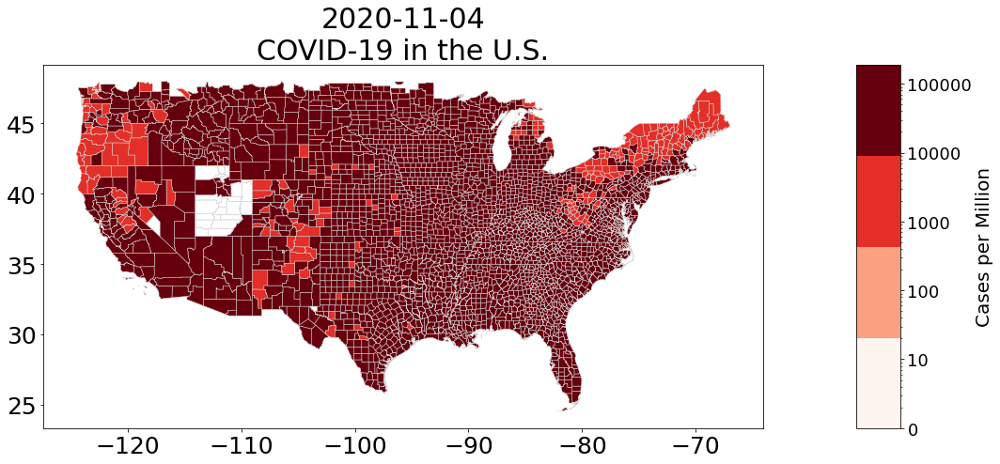

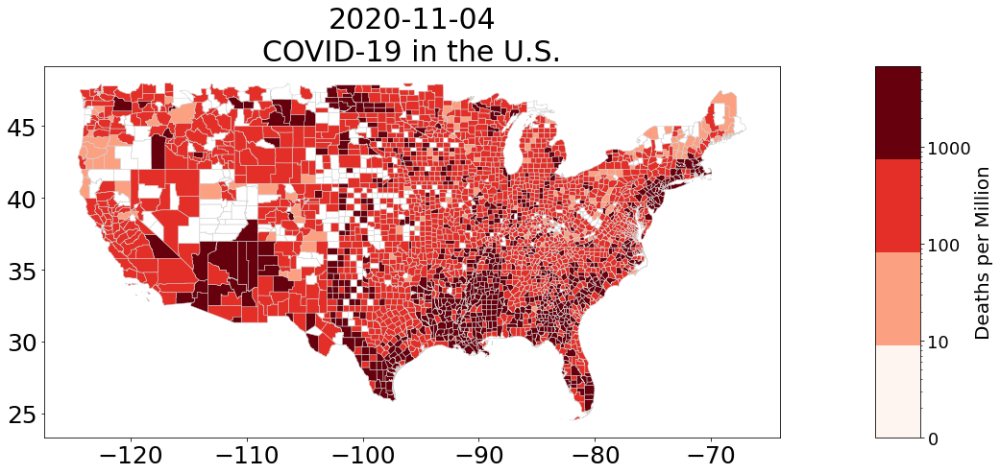

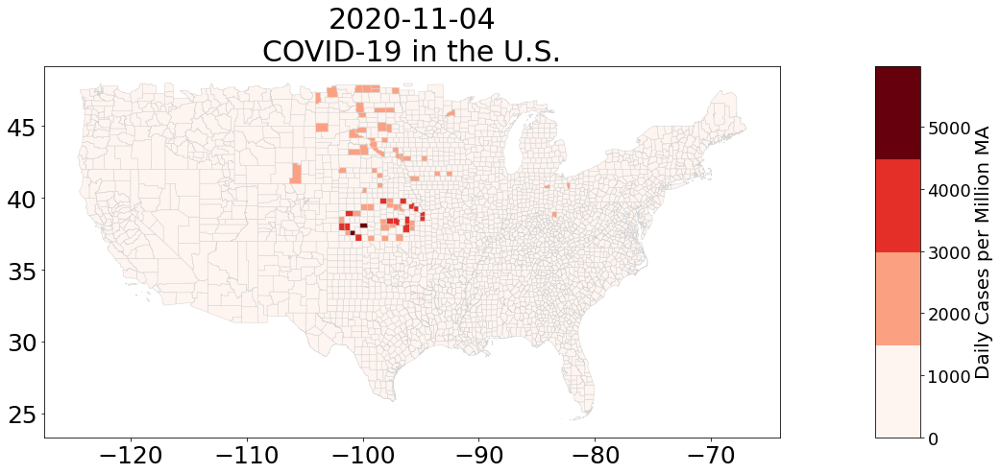

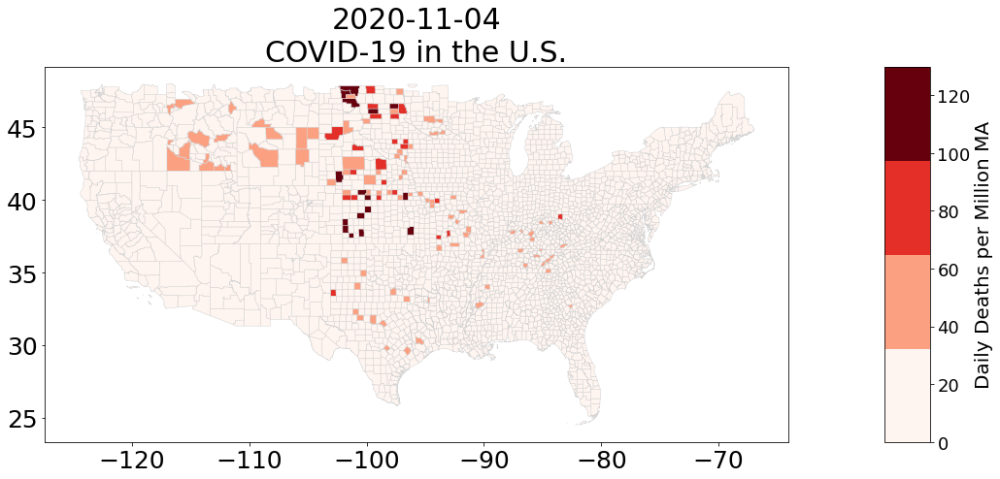

In [17]:
from matplotlib import cm
# If you choose to make a dynamic visualization for the homework
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.ticker as mtick
from matplotlib.backends.backend_pdf import PdfPages
def select_data_within_bounds(data, minx, miny, maxx, maxy):
    data = data[data.bounds["maxx"] <= maxx]
    data = data[data.bounds["maxy"] <= maxy]
    data = data[data.bounds["minx"] >= minx]
    data = data[data.bounds["miny"] >= miny]
    
    return data

def plot_map(*kwargs):
    plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    plot_df = df[df.index.get_level_values("date")==date]
    plot_df.plot(ax=ax, cax = ax, column=key, vmin=vmin ,vmax = vmax, 
                 cmap = cmap, legend=False, linewidth=.5, edgecolor='lightgrey', 
                 norm = norm)
    ax.set_title(str(date)[:10] + "\n" + "COVID-19 in the U.S.", fontsize = 30)
    
def init(*kwargs):
    size = "5%"     
    sm = cm.ScalarMappable(cmap=cmap, norm=norm)
    # empty array for the data range
    sm._A = []
    # add the colorbar to the figure
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size = size, pad = 0.1)
    # add colorbar to figure
    cbar = fig.colorbar(sm, cax=cax, cmap = cmap)
    cbar.ax.tick_params(labelsize=18)
    vals = list(cbar.ax.get_yticks())
    vals.append(vmax)
    if "Daily" not in key: vals[0] = 0 
    # format colorbar with logged or observed values
    if log:
        cbar.ax.yaxis.set_major_formatter(mtick.LogFormatter())
    else:
        cbar.ax.yaxis.set_major_formatter(mtick.Formatter())
    # format colorbar values as int
    cbar.ax.set_yticklabels([int(x) for x in vals])
    cbar.ax.set_ylabel(key, fontsize = 20)
date = dates[-1]
keys = ["Cases per Million", "Deaths per Million", 
        "Daily Cases per Million MA", "Daily Deaths per Million MA"]

if "map_bounded" not in locals():
    minx = -127
    miny = 23
    maxx = -58
    maxy = 54
    covid_data = select_data_within_bounds(covid_data, minx, miny, maxx, maxy)
    map_bounded = True
    
pp=PdfPages("covid data.pdf")

for key in keys:
    log = False if "Daily" in key else True
    # this time we replace 0 values with 1
    # so that these values show up as beige  instead of as white
    # when color axis is logged
    vmin = 1 if log else 0 
    vmax = df[key][df.index.get_level_values("date") == date].max()
    # Create colorbar as a legend
    cmap = cm.get_cmap('Reds', 4)
    if log:
        norm = cm.colors.LogNorm(vmin=vmin, vmax =vmax)
    else:
        norm = cm.colors.Normalize(vmin = vmin, vmax = vmax)

    fig, ax = plt.subplots(figsize=(18,8),
        subplot_kw = {'aspect': 'equal'})   
    plt.rcParams.update({"font.size": 30})
    plt.xticks(fontsize = 25)
    plt.yticks(fontsize = 25)
    # the functions will unpack the tuple. The same names variable names
    # are used in the function
    kwargs = (df, key, log, date, fig, ax, cmap, norm, vmin, vmax)
    init(kwargs)
    plot_map(kwargs)
    
    plt.show()
    pp.savefig(fig, bbox_inches="tight")
    plt.close()
pp.close()

In [19]:
#import unemployment data
u_data = pd.read_csv(
    "countyUnemploymentData.csv", encoding = "latin1", parse_dates = True)
index = u_data["fips_code"].dropna(axis = 0).index
u_data = u_data.loc[index]
u_data["fips_code"] = u_data["fips_code"].astype(int)
#u_data["fips_code"] = u_data[
#    "state_fips"].astype(str) + u_data["county_fips"].astype(str)
#u_data["fips_code"] = u_data["fips_code"].astype(int)
u_data.set_index(["fips_code", "date"], inplace = True)
#u_data["state_abr"] = u_data["Location"][-2:]

In [20]:
u_data.index

MultiIndex(levels=[[1001, 1003, 1005, 1007, 1009, 1011, 1013, 1015, 1017, 1019, 1021, 1023, 1025, 1027, 1029, 1031, 1033, 1035, 1037, 1039, 1041, 1043, 1045, 1047, 1049, 1051, 1053, 1055, 1057, 1059, 1061, 1063, 1065, 1067, 1069, 1071, 1073, 1075, 1077, 1079, 1081, 1083, 1085, 1087, 1089, 1091, 1093, 1095, 1097, 1099, 1101, 1103, 1105, 1107, 1109, 1111, 1113, 1115, 1117, 1119, 1121, 1123, 1125, 1127, 1129, 1131, 1133, 2013, 2016, 2020, 2050, 2060, 2068, 2070, 2090, 2100, 2105, 2110, 2122, 2130, 2150, 2158, 2164, 2170, 2180, 2185, 2188, 2195, 2198, 2220, 2230, 2240, 2261, 2275, 2282, 2290, 4001, 4003, 4005, 4007, 4009, 4011, 4012, 4013, 4015, 4017, 4019, 4021, 4023, 4025, 4027, 5001, 5003, 5005, 5007, 5009, 5011, 5013, 5015, 5017, 5019, 5021, 5023, 5025, 5027, 5029, 5031, 5033, 5035, 5037, 5039, 5041, 5043, 5045, 5047, 5049, 5051, 5053, 5055, 5057, 5059, 5061, 5063, 5065, 5067, 5069, 5071, 5073, 5075, 5077, 5079, 5081, 5083, 5085, 5087, 5089, 5091, 5093, 5095, 5097, 5099, 5101, 5103, 51

In [27]:
#COVID19Map.py
#. . . 
def create_merged_geo_dataframe(data, map_data, dates):
    data_frame_initialized = False
    counties = sorted(
        list(
            set(data.index.get_level_values("fips_code"))))
    for date in dates:
        # select county observations from each date in dates
        # select only the subset of counties in the map that
        # are also present in the covid_data
        agg_df = map_data.loc[counties]
        agg_df["date"] = date
        if data_frame_initialized == False:
            #Create new dataframe
            matching_gpd = geopandas.GeoDataFrame(agg_df, crs = map_data.crs)
            data_frame_initialized = True        
        
        else:
            # or stack thenew  data frame and the dataframe that was initialized at
            # i = 0
            matching_gpd = matching_gpd.append(agg_df, ignore_index = False)
    # reset index, then set to [fips, date]
    matching_gpd.reset_index(inplace=True)
    matching_gpd.set_index(["fips_code", "date"], inplace = True)
    
    for key, val in data.items():
        matching_gpd[key] = val
    return matching_gpd

In [28]:
dates = list(set(u_data.index.get_level_values("date")))
u_data = create_merged_geo_dataframe(u_data, map_data, dates)

/Users/shoo/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  if sys.path[0] == '':


In [29]:
# choose map bounds
#if "u_map_bounded" not in locals():
minx = -127
miny = 23
maxx = -66
maxy = 50
u_data = select_data_within_bounds(u_data, minx, miny, maxx, maxy)
u_map_bounded = True

In [30]:
counties = sorted(list(set(u_data.index.get_level_values("fips_code"))))
dates = ["Aug-19",
         "Sep-19",
         "Oct-19",
         "Nov-19",
         "Dec-19",
         "Jan-20",
         "Feb-20",
         "Mar-20",
         "Apr-20",
         "May-20",
         "Jun-20",
         "Jul-20",
         "Aug-20",
         "Sep-20"]

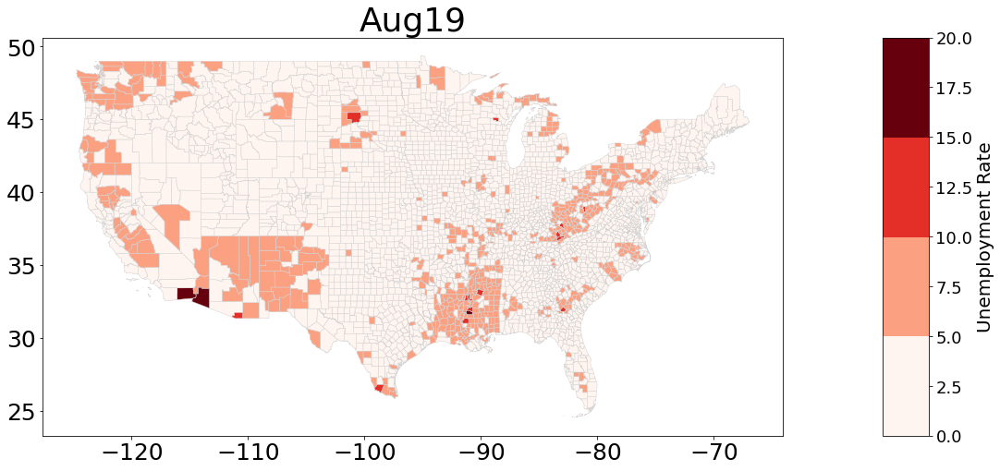

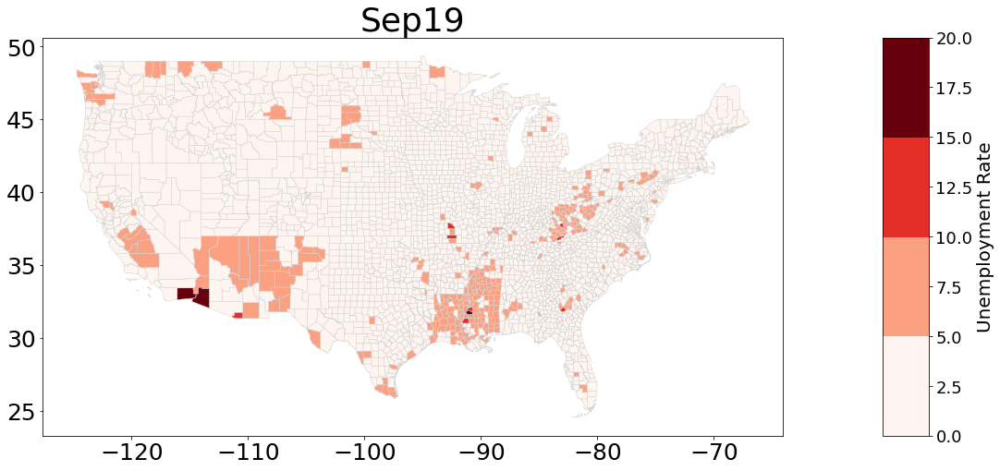

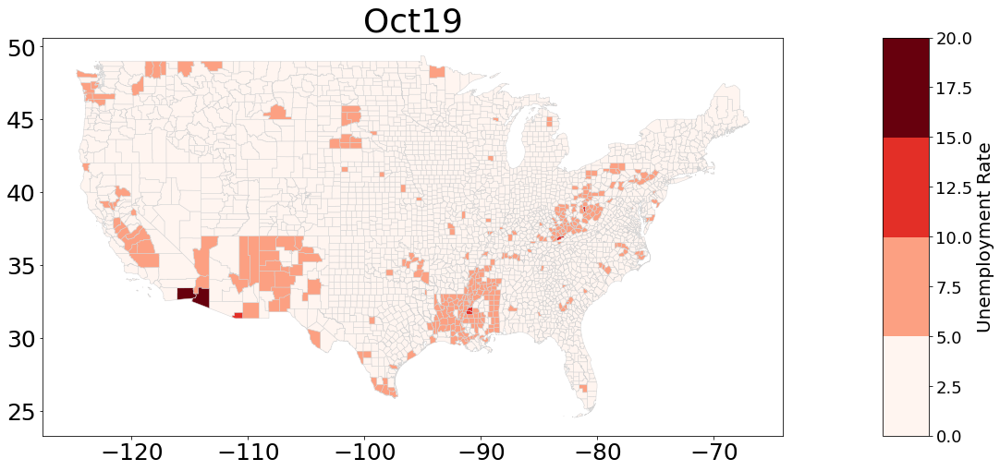

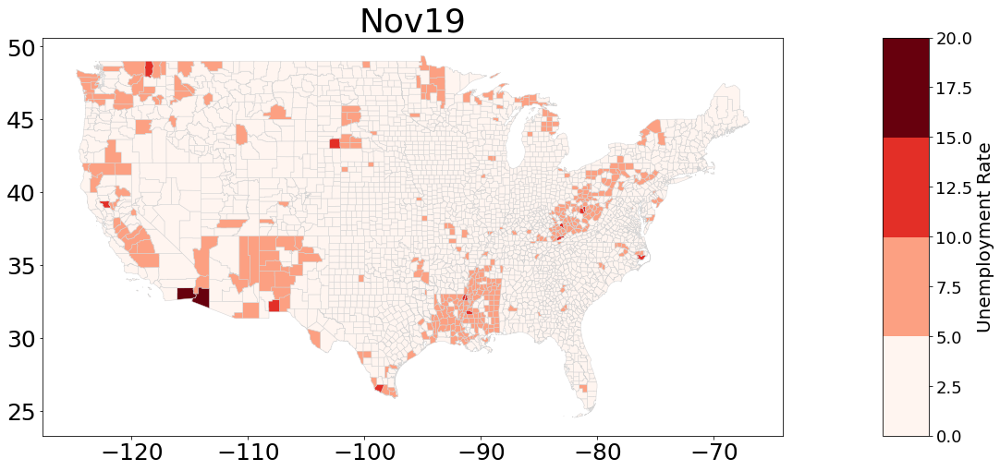

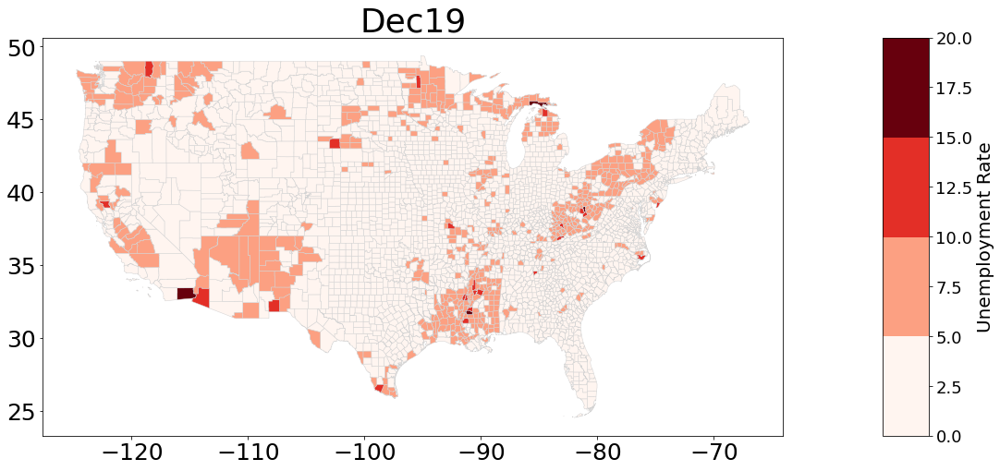

...

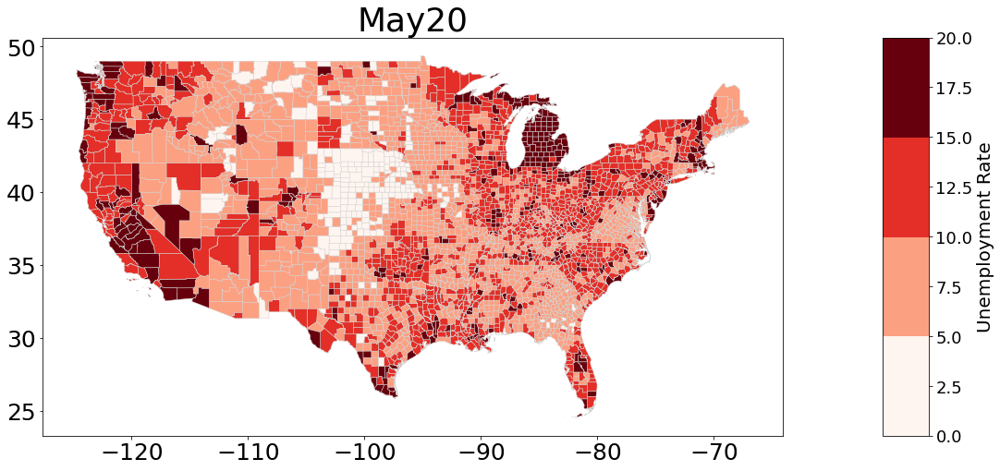

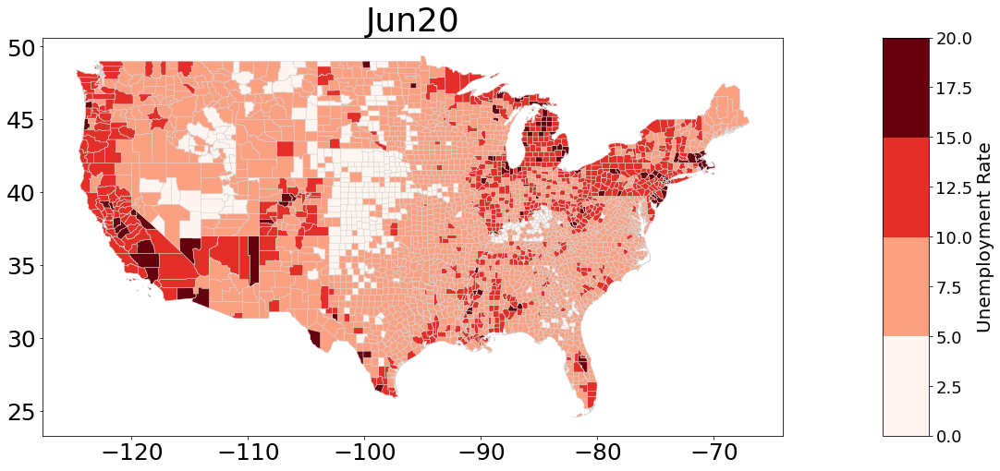

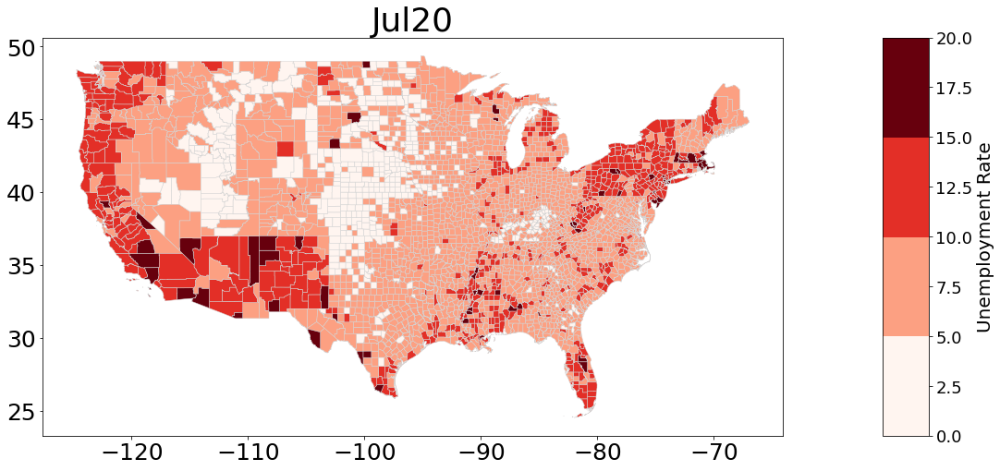

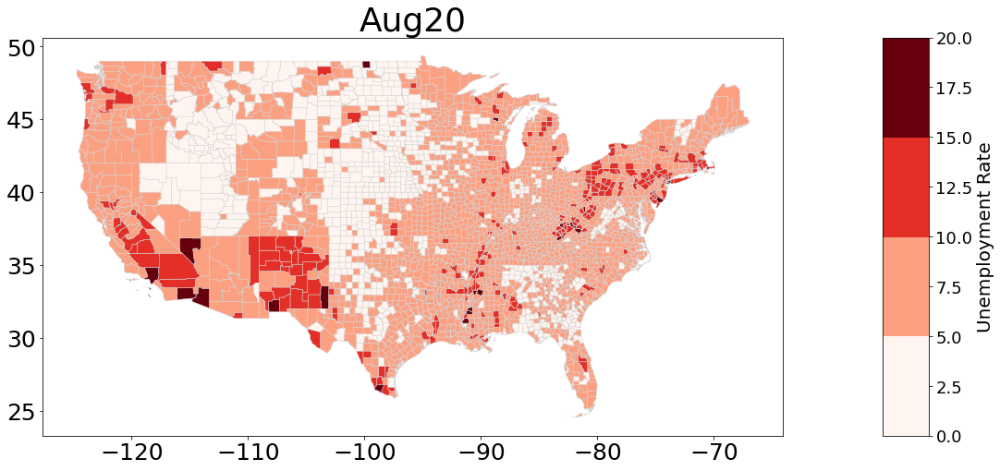

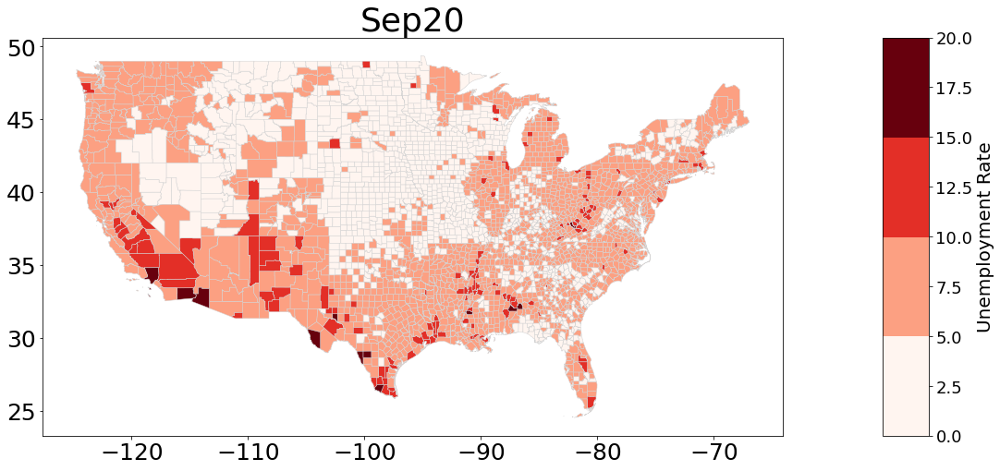

In [31]:
key = "Unemployment Rate"

u_data[key] = u_data[key].astype(float)
for date in dates:
    fig, ax = plt.subplots(figsize=(19,9),
                          subplot_kw = {"aspect":"equal"})
    plt.rcParams.update({"font.size": 30})

    plt.xticks(fontsize = 25)
    plt.yticks(fontsize = 25)

    vmin = 0
    #vmax = u_data[key].fillna(0).max()
    vmax = 20
    cmap = cm.get_cmap("Reds", 4)
    norm = cm.colors.Normalize(vmin=vmin, vmax=vmax)
    ### add colorbar
    sm = cm.ScalarMappable(cmap=cmap, norm=norm)
    # empty array for the data range
    sm.A = []
    # prepare space for colorbar
    divider = make_axes_locatable(ax)
    size = "5%"
    cax = divider.append_axes("right", size = size, pad = .1)
    # add colorbar to figure
    cbar = fig.colorbar(sm, cax=cax, cmap= cmap)
    cbar.ax.tick_params(labelsize=18)
    vals = list(cbar.ax.get_yticks())
    vals.append(vmax)
    cbar.ax.set_yticklabels(vals)#[int(x) for x in vals])
    cbar.ax.set_ylabel(key, fontsize=20)

    df = u_data[u_data.index.get_level_values("date") == date]#.dropna(axis=0)
    df.plot(ax=ax, cax=ax, column = key,
            vmin=vmin, vmax=vmax,
            cmap=cmap, legend=False, 
            linewidth = .5, edgecolor="lightgrey",norm=norm)
    ax.set_title(date.replace("-", ""))
    plt.show()
    plt.close()

In [32]:
# Normalize Unemployment Feb-20 == 1
key = "Unemployment Rate"
n_u_data = u_data.copy()
key = "Unemployment Rate"
for county in counties:
    n_u_data[key][county] = n_u_data.loc[county, key].div(n_u_data.loc[county, "Feb-20"][key])

/Users/shoo/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


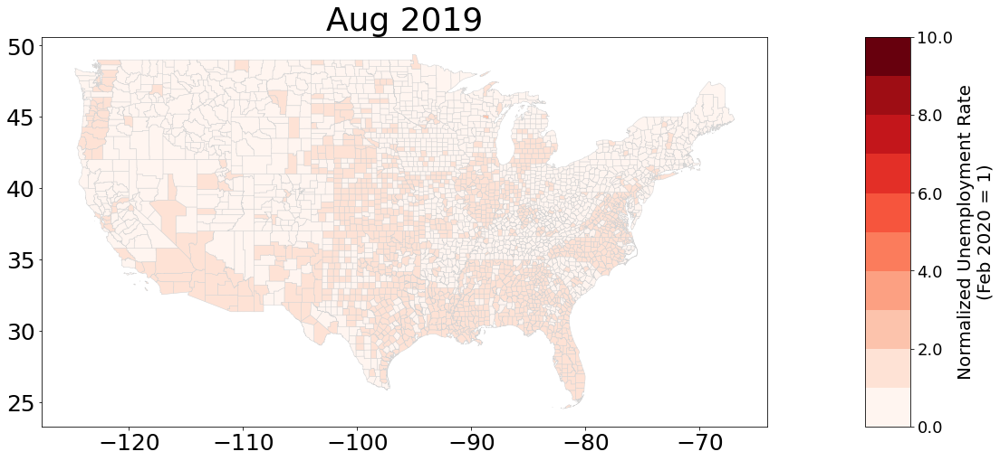

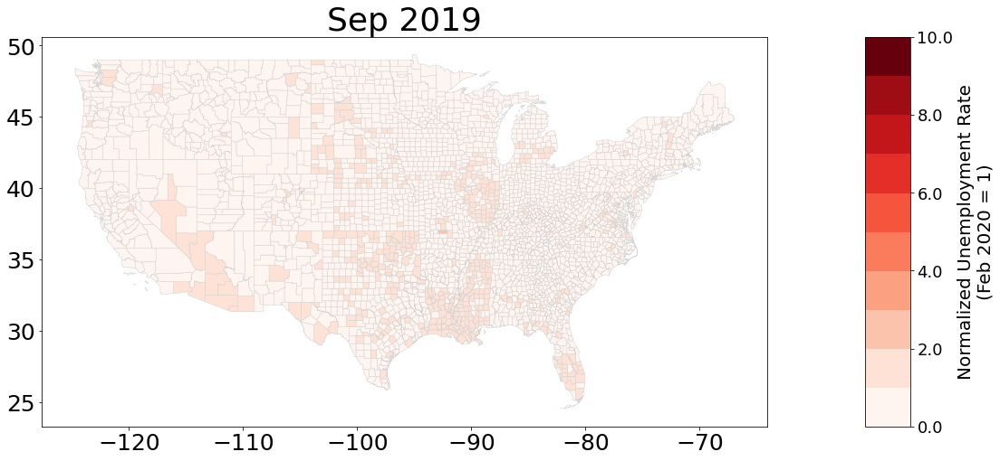

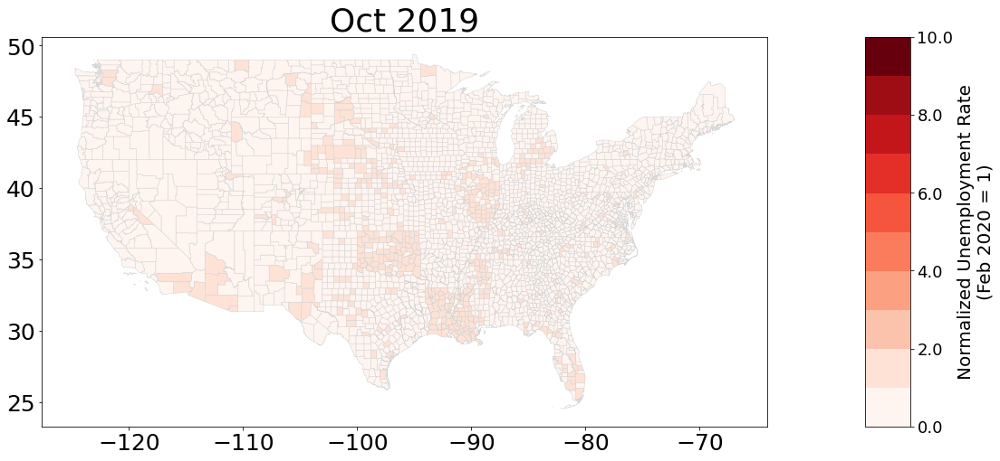

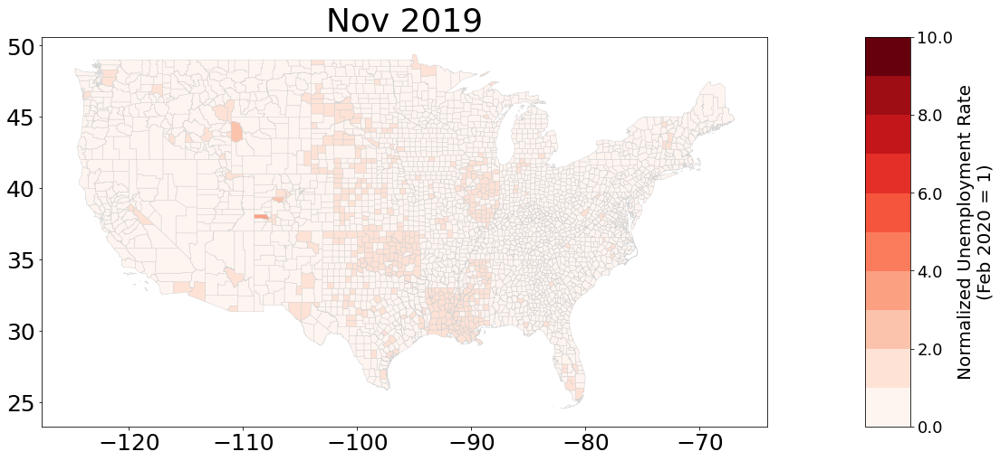

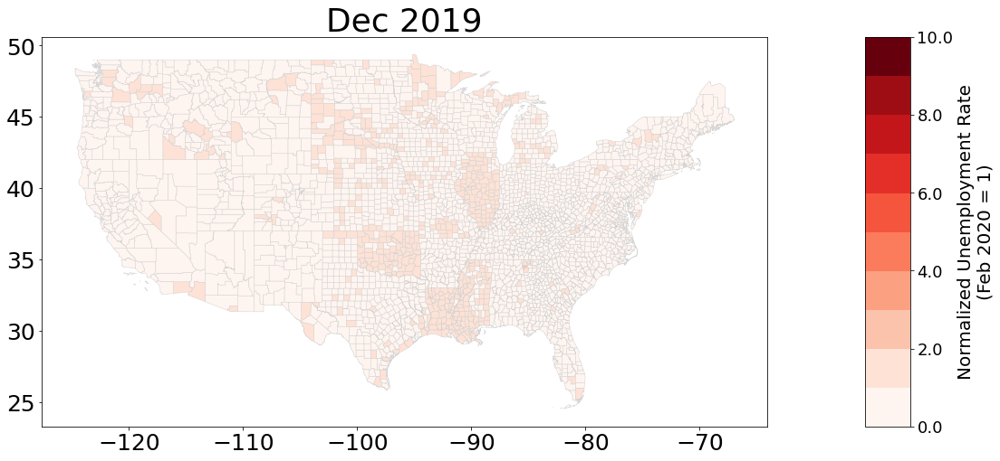

...

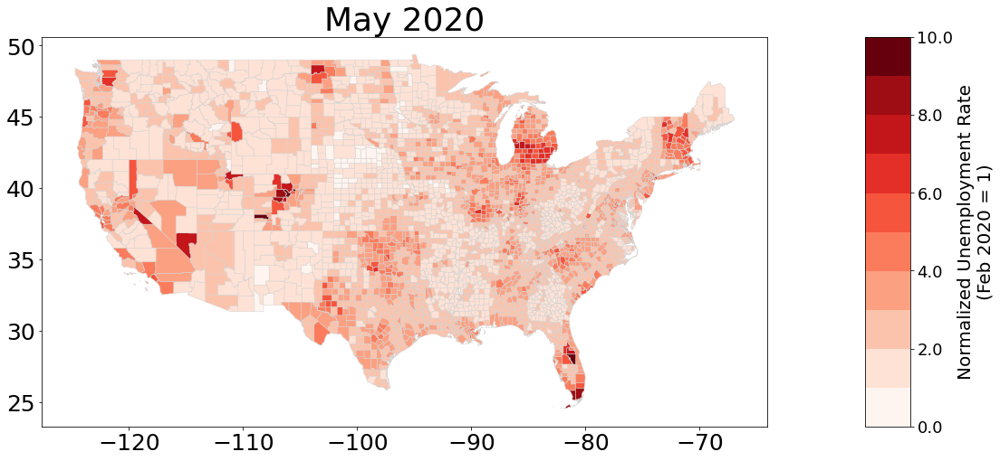

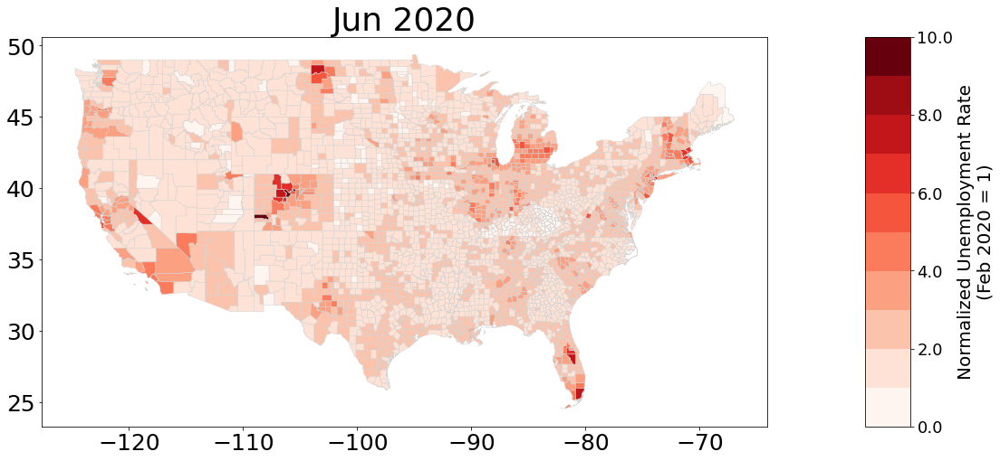

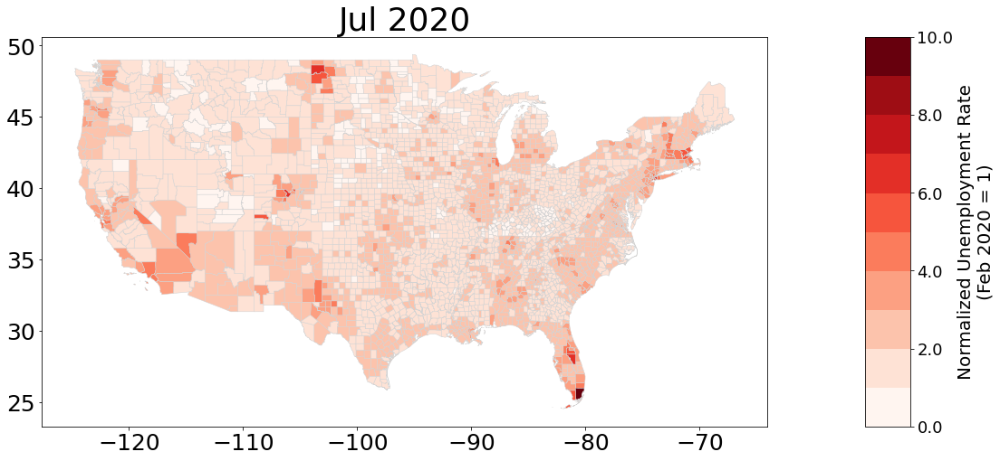

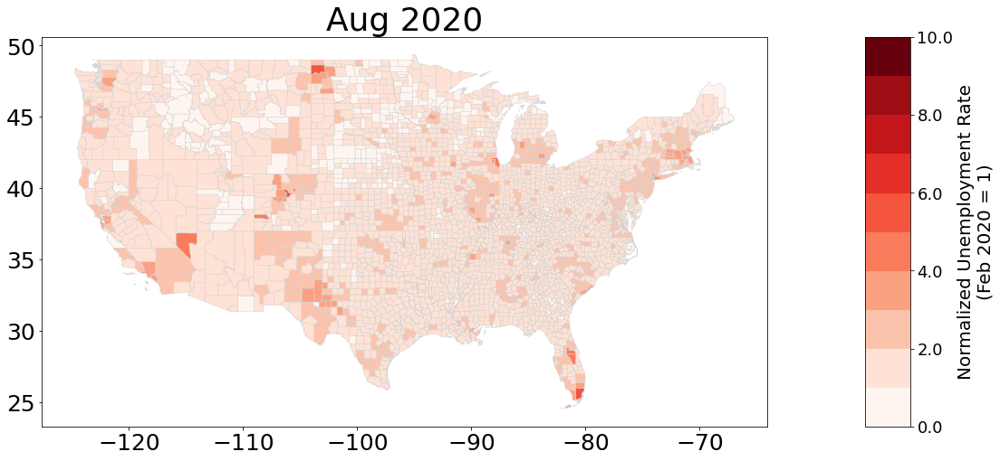

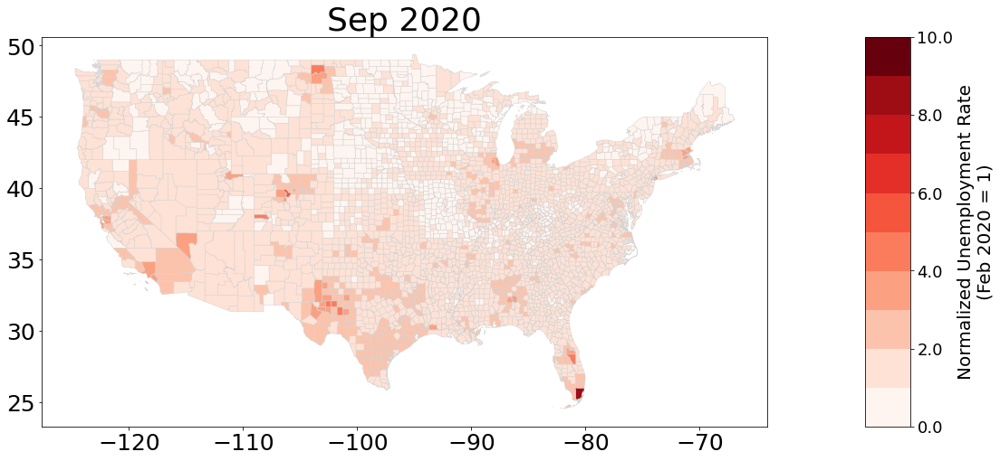

In [33]:
for date in dates:
    title_date = date[:-3]+" 20" + date[-2:]
    fig, ax = plt.subplots(figsize=(19,9),
                          subplot_kw = {"aspect":"equal"})
    plt.rcParams.update({"font.size": 30})

    plt.xticks(fontsize = 25)
    plt.yticks(fontsize = 25)

    vmin = 0# n_u_data["Unemployment Rate"].min()
    vmax = 10
    cmap = cm.get_cmap("Reds", 10)
    norm = cm.colors.Normalize(vmin=vmin, vmax=vmax)
    ### add colorbar
    sm = cm.ScalarMappable(cmap=cmap, norm=norm)
    # empty array for the data range
    sm.A = []
    # prepare space for colorbar
    divider = make_axes_locatable(ax)
    size = "5%"
    cax = divider.append_axes("right", size = size, pad = .1)
    # add colorbar to figure
    cbar = fig.colorbar(sm, cax=cax, cmap= cmap)
    cbar.ax.tick_params(labelsize=18)
    vals = list(cbar.ax.get_yticks())
    vals.append(vmax)
    cbar.ax.set_yticklabels(vals)#[int(x) for x in vals])
    cbar.ax.set_ylabel("Normalized "+key + "\n(Feb 2020 = 1)", fontsize=20)
    
    df = n_u_data[n_u_data.index.get_level_values("date") == date]#.dropna(axis=0)
    df.plot(ax=ax, cax=ax, column = key,
            vmin=vmin, vmax=vmax,
            cmap=cmap, legend=False, 
            linewidth = .5, edgecolor="lightgrey",norm=norm)
    ax.set_title(title_date)
    plt.show()
    plt.close()

working with panel data

In [34]:
#multiIndex.py
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

data = pd.read_excel("mpd2018.xlsx",
                    sheet_name = "Full data",
                    index_col = [0, 2])
data

FileNotFoundError: [Errno 2] No such file or directory: 'mpd2018.xlsx'

In [35]:
countries = data.groupby("countrycode").mean().index
countries

NameError: name 'data' is not defined

In [36]:
years = data.groupby("year").mean().index
years

NameError: name 'data' is not defined

In [37]:
data.groupby("year").sum()

NameError: name 'data' is not defined

In [38]:
data.groupby("countrycode").diff()

NameError: name 'data' is not defined

NameError: name 'data' is not defined

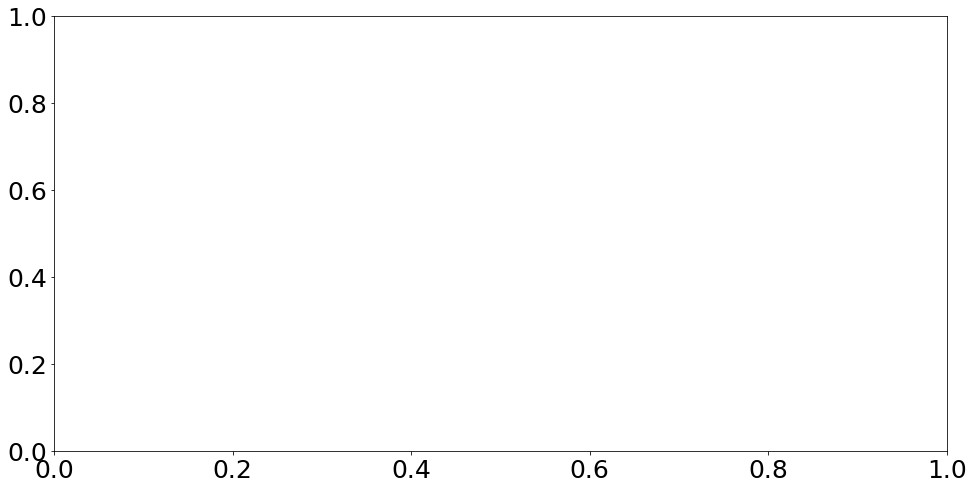

In [39]:
#multiIndex.py
# . . .
# pairs of countries to compare in plots
pairs = [("CAN", "FIN"), ("FRA", "DEU"), ("GBR", "NLD")]
linestyles = ["-", ":"]

plt.rcParams.update({"font.size": 25})
for pair in pairs:
    fig, ax = plt.subplots(figsize= (16, 8))
    for i in range(len(pair)):
        country_code = pair[i]
        # gather country name associated with country_code
        country_name = data.loc[country_code,2000]["country"]
        linestyle = linestyles[i]
        # plot country, and all dataes (:)
        data.loc[country_code, :]["cgdppc"].dropna(
            ).plot.line(ax = ax, label = country_name,
                       linestyle = linestyle)
    plt.xlim([1825, max(years)])
    plt.ylabel("Real GDP Per Capita\n2011 U.S. Dollars")
    plt.legend()
    plt.show()
    plt.close()

In [40]:
#dataForPanel.py
import pandas as pd

# make sure dates are imported in the same format; to do this,
# we turn off parse dates
fraser_data = pd.read_excel(
    "efw-2019-master-index-data-for-researchers.xlsx",
    sheet_name = "EFW Panel Data 2019 Report",
    header = [2],  index_col = [2,1], parse_dates = False)
fraser_data = fraser_data.dropna(
    axis = 0, thresh = 1).dropna(axis = 1, thresh = 1)
fraser_data

FileNotFoundError: [Errno 2] No such file or directory: 'efw-2019-master-index-data-for-researchers.xlsx'

In [41]:
maddison_data = data
fraser_data["RGDP Per Capita"] = maddison_data["cgdppc"]
fraser_data

NameError: name 'data' is not defined

In [42]:
fraser_data.to_csv("fraserDataWithRGDPPC.csv")

NameError: name 'fraser_data' is not defined

In [43]:
#indicatorVariable.py
def create_indicator_variable(data, indicator_name,
                              index_name, target_index_list):
    data[indicator_name] = 0
    # for each index whose name matches an entry in 
    # target_index_list a value of 1 will be recorded
    for index in target_index_list:
        data.loc[data.index.get_level_values(
            index_name) == index, [indicator_name]] = 1 
        
data = pd.read_csv("fraserDataWithRGDPPC.csv",
                  index_col = ["ISO_Code", "Year"],
                  parse_dates = True)

# select "ISO_Code" from names of double index
index_name = data.index.names[0]
indicator_name = "North America"

# select ISO_codes that will be marked 1 since they are
# in north america
countries_in_north_america = [
    "BHS", "BRB", "BLZ", "CAN", "CRI", "DOM", "SLV",
    "GTM", "HTI", "HND", "JAM", "MEX", "NIC", "PAN",
    "TTO", "USA"]  
        
create_indicator_variable(data = data,
                indicator_name = indicator_name,
                index_name = index_name,
                target_index_list = countries_in_north_america)
        
        
        
data

FileNotFoundError: [Errno 2] File b'fraserDataWithRGDPPC.csv' does not exist: b'fraserDataWithRGDPPC.csv'

In [44]:
data.loc[["USA", "MEX"]]

NameError: name 'data' is not defined